In [1]:
import os

os.environ['XLA_FLAGS'] = '--xla_gpu_cuda_data_dir=/opt/cuda'
os.environ['PATH'] = f"/usr/local/cuda-12.8/bin:${os.environ['PATH']}"

try:
    os.environ['LD_LIBRARY_PATH'] = f"/usr/local/cuda-12.8/:${os.environ['LD_LIBRARY_PATH']}"
except KeyError:
    os.environ['LD_LIBRARY_PATH'] = f"/usr/local/cuda-12.8/"

In [2]:
from datetime import datetime
from math import ceil, floor
from pathlib import Path
import random

import astropy.io.fits as fits
import cv2 as cv
import matplotlib.pyplot as plt
from matplotlib.colors import PowerNorm
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras


2025-03-05 13:01:25.728052: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1741179685.742590 2882027 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1741179685.746948 2882027 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-05 13:01:25.761120: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
# Check if there are available GPUs
print("Num GPUs available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs available:  1


In [4]:
# Constants

dataset_path = Path("./dataset/")

# nn_input_shape = (512, 512)
nn_input_shape = (256, 256)

In [5]:
# Load the dataset
print("Loading dataset...", end="\n\n")

def load_dataset(current_dataset_path):
    current_dataset = {}

    # Process each entry in the dataset
    for entry_path in current_dataset_path.iterdir():
        if not entry_path.is_dir():
            print(f"Skipping non-directory item: {entry_path}")
            continue

        entry_id = entry_path.name

        try:
            # Load the image
            image_path = entry_path / f"{entry_id}-image.fits"
            with fits.open(image_path) as image_hdu_list:
                fits_image = image_hdu_list[0].data

            # Load the detected objects' information
            objects_path = entry_path / f"{entry_id}-axy.fits"
            with fits.open(objects_path) as axy_hdu_list:
                detected_objects = axy_hdu_list[1].data

            if fits_image is None or detected_objects is None or len(detected_objects) == 0:
                raise ValueError

        except TypeError:
            print(f"Skipping too large entry: {entry_id}")
            continue
        except (OSError, ValueError):
            print(f"Skipping incomplete or corrupt entry: {entry_id}")
            continue

        # Convert the image shape to the standard format to be easily handled and to monochrome
        if len(fits_image.shape) == 3 and fits_image.shape[0] == 3:
            try:
                original_image = np.rollaxis(fits_image, 0, 3)
                monochrome_image = cv.cvtColor(original_image, cv.COLOR_BGR2GRAY)

            except cv.error:
                print(f"Warning! Error converting to monochrome image at entry {entry_id}")
                continue

        elif len(fits_image.shape) == 2:  # Image is monochrome
            original_image = fits_image
            monochrome_image = fits_image

        else:
            print(f"Warning! Unknown image shape found at entry {entry_id} with shape {fits_image.shape}")
            continue

        # Normalize pixel values between 0 and 1
        normalized_image = (monochrome_image / monochrome_image.max())
        if normalized_image.max() != 1.0:
            print(f"Warning! Unknown value found while normalizing entry {entry_id}")
            continue

        # Resize image
        resized_image = cv.resize(normalized_image, nn_input_shape)

        # Extract relevant information from the detected objects on the image
        objects_info = np.stack([detected_objects["X"], detected_objects["Y"], detected_objects["FLUX"]], axis=-1)

        # Create a segmentation mask based on the detected objects' locations
        #   - Background = 0
        #   - Detected object = 1
        segmentation_mask = np.zeros_like(resized_image).astype(np.uint8)

        radius = 2
        filtered_objects_info = []
        for object_info in objects_info:
            original_x_coord, original_y_coord, object_flux = object_info

            # Adapt object coordinates to the resized image
            adapted_x_coord = (original_x_coord * nn_input_shape[1]) / original_image.shape[1]
            adapted_y_coord = (original_y_coord * nn_input_shape[0]) / original_image.shape[0]

            if object_flux > 70:
                filtered_objects_info.append((
                    adapted_x_coord,
                    adapted_y_coord,
                    object_flux,
                ))

                # Calculate the bounding box of the object inside the image
                lower_x_coord = floor(min(
                    max((adapted_x_coord - radius), 0),
                    nn_input_shape[1],
                ))
                upper_x_coord = ceil(max(
                    min((adapted_x_coord + radius), nn_input_shape[1]),
                    0,
                ))
                lower_y_coord = floor(min(
                    max((adapted_y_coord - radius), 0),
                    nn_input_shape[0],
                ))
                upper_y_coord = ceil(max(
                    min((adapted_y_coord + radius), nn_input_shape[0]),
                    0,
                ))

                # Add the bounding box to the mask
                segmentation_mask[
                    lower_y_coord : upper_y_coord,
                    lower_x_coord : upper_x_coord,
                ] = 1

        nn_input_image = resized_image

        # Store dataset entry information
        current_dataset[entry_id] = {
            # "original_image": original_image,
            "nn_input_image": nn_input_image.copy(),
            # "objects_info": objects_info,
            "filtered_objects_info": filtered_objects_info.copy(),
            "segmentation_mask": segmentation_mask.copy(),
        }

    return current_dataset


dataset = load_dataset(dataset_path)
print(f"\nDataset created containing {len(dataset)} entries")


Loading dataset...

Skipping incomplete or corrupt entry: 2022295
Skipping incomplete or corrupt entry: 3303144
Skipping incomplete or corrupt entry: 6804774
Skipping incomplete or corrupt entry: 959363
Skipping incomplete or corrupt entry: 6762649
Warning! Unknown value found while normalizing entry 5327248
Skipping incomplete or corrupt entry: 1697524
Skipping incomplete or corrupt entry: 9032704
Skipping incomplete or corrupt entry: 2743979
Skipping incomplete or corrupt entry: 6031638
Skipping incomplete or corrupt entry: 9667733
Skipping incomplete or corrupt entry: 2621740
Skipping incomplete or corrupt entry: 7545230
Skipping incomplete or corrupt entry: 92077
Skipping incomplete or corrupt entry: 2467216
Skipping incomplete or corrupt entry: 9498027
Skipping incomplete or corrupt entry: 4690442
Skipping incomplete or corrupt entry: 1794893
Skipping incomplete or corrupt entry: 7978245
Skipping incomplete or corrupt entry: 3553878
Skipping incomplete or corrupt entry: 2756027
Sk

Skipping incomplete or corrupt entry: 8840732
Skipping incomplete or corrupt entry: 800055
Skipping incomplete or corrupt entry: 4766903
Skipping incomplete or corrupt entry: 9397067
Skipping incomplete or corrupt entry: 5808833
Skipping incomplete or corrupt entry: 9212071
Skipping incomplete or corrupt entry: 7231392
Skipping incomplete or corrupt entry: 9852934
Skipping incomplete or corrupt entry: 8827588
Skipping too large entry: 8365038


Skipping incomplete or corrupt entry: 6412295
Skipping incomplete or corrupt entry: 1056661
Skipping incomplete or corrupt entry: 5803316
Skipping incomplete or corrupt entry: 8563216
Skipping incomplete or corrupt entry: 6385145
Skipping incomplete or corrupt entry: 8841501
Skipping incomplete or corrupt entry: 2684727
Skipping incomplete or corrupt entry: 6990106
Skipping incomplete or corrupt entry: 7608931
Skipping incomplete or corrupt entry: 4761559
Skipping incomplete or corrupt entry: 3811127
Skipping incomplete or corrupt entry: 2505792
Skipping incomplete or corrupt entry: 4733972


Skipping incomplete or corrupt entry: 9754851
Skipping incomplete or corrupt entry: 8569104
Skipping incomplete or corrupt entry: 4953301
Skipping incomplete or corrupt entry: 9462991
Skipping incomplete or corrupt entry: 957138
Skipping incomplete or corrupt entry: 4778522
Skipping incomplete or corrupt entry: 8787302
Skipping incomplete or corrupt entry: 2509223
Skipping incomplete or corrupt entry: 8540814
Skipping incomplete or corrupt entry: 3046045
Skipping incomplete or corrupt entry: 7292151
Skipping incomplete or corrupt entry: 6544526
Skipping incomplete or corrupt entry: 2985080
Skipping incomplete or corrupt entry: 8227410
Warning! Unknown value found while normalizing entry 9976287
Skipping incomplete or corrupt entry: 4422342
Skipping incomplete or corrupt entry: 7191231
Skipping incomplete or corrupt entry: 998923
Skipping too large entry: 5123190
Skipping incomplete or corrupt entry: 3752317
Warning! Unknown value found while normalizing entry 8571587
Skipping incomplet

Skipping incomplete or corrupt entry: 6950892
Skipping incomplete or corrupt entry: 6812447
Skipping incomplete or corrupt entry: 9201738
Skipping incomplete or corrupt entry: 7395491
Skipping incomplete or corrupt entry: 7187340
Warning! Unknown value found while normalizing entry 5318287
Skipping incomplete or corrupt entry: 8798370
Skipping incomplete or corrupt entry: 226608
Skipping incomplete or corrupt entry: 3167228
Skipping incomplete or corrupt entry: 3156734
Skipping incomplete or corrupt entry: 7004348
Skipping incomplete or corrupt entry: 6090013
Skipping incomplete or corrupt entry: 8807116
Skipping incomplete or corrupt entry: 7031888
Skipping incomplete or corrupt entry: 5949720
Skipping incomplete or corrupt entry: 4306939
Skipping incomplete or corrupt entry: 3416795
Skipping incomplete or corrupt entry: 8581750
Skipping incomplete or corrupt entry: 8039645
Skipping incomplete or corrupt entry: 9587311
Skipping incomplete or corrupt entry: 5962374
Skipping incomplete 

Skipping incomplete or corrupt entry: 749767
Skipping incomplete or corrupt entry: 1062017
Skipping incomplete or corrupt entry: 140405
Skipping incomplete or corrupt entry: 5414861
Skipping incomplete or corrupt entry: 8549138
Skipping incomplete or corrupt entry: 4766670
Skipping incomplete or corrupt entry: 5720041
Skipping incomplete or corrupt entry: 6287929
Skipping too large entry: 6368961


Skipping incomplete or corrupt entry: 854239
Skipping incomplete or corrupt entry: 9951122
Skipping incomplete or corrupt entry: 8984592
Skipping too large entry: 2556623
Skipping incomplete or corrupt entry: 8304766
Skipping incomplete or corrupt entry: 6355877
Skipping incomplete or corrupt entry: 1256803


Skipping incomplete or corrupt entry: 3097720
Warning! Unknown value found while normalizing entry 7991292
Skipping incomplete or corrupt entry: 1678824
Skipping incomplete or corrupt entry: 209404
Skipping incomplete or corrupt entry: 4127834
Skipping incomplete or corrupt entry: 5800556
Skipping incomplete or corrupt entry: 9109270
Skipping incomplete or corrupt entry: 8028767
Skipping incomplete or corrupt entry: 7853220
Skipping incomplete or corrupt entry: 9396758
Skipping incomplete or corrupt entry: 7586337
Skipping incomplete or corrupt entry: 4002156
Skipping incomplete or corrupt entry: 6250237
Skipping incomplete or corrupt entry: 923256
Skipping incomplete or corrupt entry: 1936677
Skipping incomplete or corrupt entry: 8929602
Skipping incomplete or corrupt entry: 9874624
Skipping incomplete or corrupt entry: 7770982
Skipping incomplete or corrupt entry: 9304442
Skipping incomplete or corrupt entry: 146720
Skipping incomplete or corrupt entry: 8841131
Skipping incomplete or

Skipping incomplete or corrupt entry: 4400228
Skipping incomplete or corrupt entry: 9927613
Skipping incomplete or corrupt entry: 3508839
Skipping incomplete or corrupt entry: 9251172


/tmp/ipykernel_2882027/591472062.py:55: RuntimeWarning: invalid value encountered in divide
  normalized_image = (monochrome_image / monochrome_image.max())


Warning! Unknown value found while normalizing entry 7839026
Skipping incomplete or corrupt entry: 5003995
Skipping incomplete or corrupt entry: 4682320
Skipping incomplete or corrupt entry: 8856956
Skipping incomplete or corrupt entry: 7656151
Skipping incomplete or corrupt entry: 8781433
Skipping incomplete or corrupt entry: 794959
Skipping too large entry: 8002379
Skipping incomplete or corrupt entry: 189784
Skipping incomplete or corrupt entry: 5165956
Skipping incomplete or corrupt entry: 917607
Skipping incomplete or corrupt entry: 8030794
Skipping incomplete or corrupt entry: 7517210
Skipping incomplete or corrupt entry: 3718040
Skipping incomplete or corrupt entry: 8994334
Skipping incomplete or corrupt entry: 7660007
Skipping incomplete or corrupt entry: 3992482
Skipping incomplete or corrupt entry: 2234229
Skipping incomplete or corrupt entry: 9892182
Skipping incomplete or corrupt entry: 9972411
Skipping incomplete or corrupt entry: 1077870
Skipping incomplete or corrupt ent

Skipping incomplete or corrupt entry: 9653982
Skipping incomplete or corrupt entry: 9947775
Skipping incomplete or corrupt entry: 5996265
Skipping incomplete or corrupt entry: 7272685
Skipping incomplete or corrupt entry: 3261377
Skipping incomplete or corrupt entry: 1046463
Skipping incomplete or corrupt entry: 7770777
Skipping incomplete or corrupt entry: 1290604
Warning! Unknown value found while normalizing entry 5382488
Skipping incomplete or corrupt entry: 7517280


Skipping too large entry: 5930182
Skipping incomplete or corrupt entry: 4416415
Skipping incomplete or corrupt entry: 7458209
Skipping incomplete or corrupt entry: 1288984
Skipping incomplete or corrupt entry: 8714966
Skipping incomplete or corrupt entry: 8069160
Skipping incomplete or corrupt entry: 9940258
Skipping incomplete or corrupt entry: 5155375
Skipping incomplete or corrupt entry: 7135108
Warning! Unknown value found while normalizing entry 5375923
Skipping incomplete or corrupt entry: 60693
Skipping incomplete or corrupt entry: 6725667
Skipping incomplete or corrupt entry: 8062175
Warning! Unknown value found while normalizing entry 5284579
Skipping incomplete or corrupt entry: 7283724
Skipping incomplete or corrupt entry: 7670739
Skipping incomplete or corrupt entry: 9329140
Skipping incomplete or corrupt entry: 1005268
Skipping incomplete or corrupt entry: 2787838
Skipping incomplete or corrupt entry: 7663649
Skipping incomplete or corrupt entry: 1340280
Skipping incomplet

Skipping incomplete or corrupt entry: 6494300
Skipping incomplete or corrupt entry: 5080845
Skipping incomplete or corrupt entry: 6769998
Skipping incomplete or corrupt entry: 7560657
Skipping incomplete or corrupt entry: 7867457
Skipping incomplete or corrupt entry: 9858148
Skipping incomplete or corrupt entry: 9120969
Skipping incomplete or corrupt entry: 7766799
Skipping incomplete or corrupt entry: 7930592
Skipping incomplete or corrupt entry: 4138374
Skipping incomplete or corrupt entry: 3141864
Skipping incomplete or corrupt entry: 5798842
Skipping incomplete or corrupt entry: 7697040
Skipping incomplete or corrupt entry: 863741
Skipping incomplete or corrupt entry: 7660115
Skipping incomplete or corrupt entry: 8427234
Skipping incomplete or corrupt entry: 9654473
Skipping incomplete or corrupt entry: 1450416
Skipping incomplete or corrupt entry: 7696890
Skipping incomplete or corrupt entry: 151838
Skipping incomplete or corrupt entry: 4294593
Skipping incomplete or corrupt entry

Skipping incomplete or corrupt entry: 1853615
Skipping incomplete or corrupt entry: 2828518
Skipping incomplete or corrupt entry: 120997
Skipping incomplete or corrupt entry: 9558626
Skipping incomplete or corrupt entry: 9057763
Skipping incomplete or corrupt entry: 9544563
Skipping incomplete or corrupt entry: 7811830
Skipping incomplete or corrupt entry: 1950233
Skipping incomplete or corrupt entry: 9817499
Skipping incomplete or corrupt entry: 846450
Skipping incomplete or corrupt entry: 906175
Skipping incomplete or corrupt entry: 4756210
Skipping incomplete or corrupt entry: 5768566
Skipping incomplete or corrupt entry: 9977108
Skipping incomplete or corrupt entry: 3424558
Skipping incomplete or corrupt entry: 3501382
Skipping incomplete or corrupt entry: 8263459


Skipping too large entry: 7357536
Skipping incomplete or corrupt entry: 2817571
Skipping incomplete or corrupt entry: 3648259
Skipping too large entry: 4330189
Skipping incomplete or corrupt entry: 8372017
Skipping incomplete or corrupt entry: 7297346
Skipping incomplete or corrupt entry: 8856306
Skipping incomplete or corrupt entry: 5462771
Skipping incomplete or corrupt entry: 2868970
Skipping incomplete or corrupt entry: 1102791
Skipping incomplete or corrupt entry: 6679393
Skipping incomplete or corrupt entry: 6231043
Skipping incomplete or corrupt entry: 849101
Skipping incomplete or corrupt entry: 3137196
Skipping incomplete or corrupt entry: 8953171
Skipping incomplete or corrupt entry: 4277119
Skipping incomplete or corrupt entry: 5241264
Skipping incomplete or corrupt entry: 5040160
Skipping incomplete or corrupt entry: 8345402
Skipping incomplete or corrupt entry: 9243951
Skipping incomplete or corrupt entry: 2237777
Skipping incomplete or corrupt entry: 6629158
Skipping inco

Skipping incomplete or corrupt entry: 7221031
Skipping incomplete or corrupt entry: 5494868
Skipping incomplete or corrupt entry: 2176078
Skipping incomplete or corrupt entry: 8425794
Skipping incomplete or corrupt entry: 1878778
Skipping incomplete or corrupt entry: 7446518
Skipping too large entry: 5850842
Skipping incomplete or corrupt entry: 745595
Warning! Unknown value found while normalizing entry 1906223
Skipping incomplete or corrupt entry: 4873816


Skipping incomplete or corrupt entry: 5909443
Skipping incomplete or corrupt entry: 103618
Skipping incomplete or corrupt entry: 210043
Skipping incomplete or corrupt entry: 9776225
Skipping incomplete or corrupt entry: 8704476
Skipping incomplete or corrupt entry: 2463093
Skipping incomplete or corrupt entry: 159575
Skipping incomplete or corrupt entry: 9334549
Warning! Unknown value found while normalizing entry 5369203
Skipping incomplete or corrupt entry: 5414183
Skipping incomplete or corrupt entry: 5181423
Skipping incomplete or corrupt entry: 9380446
Skipping incomplete or corrupt entry: 8825801
Skipping incomplete or corrupt entry: 8042902
Skipping incomplete or corrupt entry: 6803488
Skipping too large entry: 3690180


Skipping incomplete or corrupt entry: 9818281
Skipping incomplete or corrupt entry: 2547794
Warning! Unknown value found while normalizing entry 9438247
Skipping incomplete or corrupt entry: 8007637
Skipping incomplete or corrupt entry: 5942625
Skipping incomplete or corrupt entry: 261351
Skipping incomplete or corrupt entry: 9263741
Skipping incomplete or corrupt entry: 4813801
Skipping incomplete or corrupt entry: 57144
Skipping incomplete or corrupt entry: 960039
Skipping incomplete or corrupt entry: 5390323
Skipping incomplete or corrupt entry: 746737
Skipping incomplete or corrupt entry: 3182873
Skipping incomplete or corrupt entry: 7889086
Skipping incomplete or corrupt entry: 8883529
Skipping incomplete or corrupt entry: 8818330
Skipping incomplete or corrupt entry: 4573690
Skipping incomplete or corrupt entry: 5225118
Skipping incomplete or corrupt entry: 7858867
Skipping incomplete or corrupt entry: 6542090
Skipping incomplete or corrupt entry: 5697102
Skipping incomplete or c

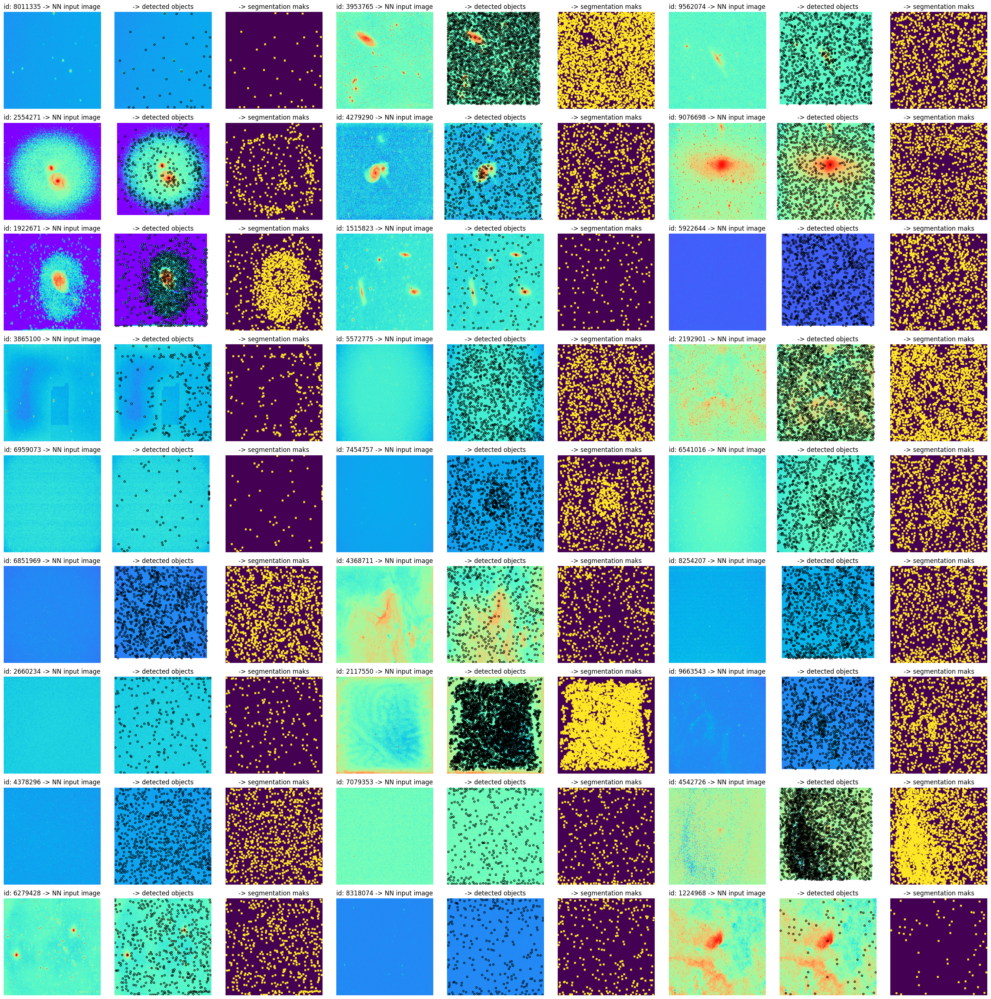

In [6]:
# Dataset sample preview:

# Prepare the plot
rows, cols, subcols = 9, 3, 3
_, axs = plt.subplots(rows, (cols * subcols), figsize=((cols * subcols) * 3, rows * 3))

samples_entries_ids = random.sample(list(dataset.keys()), rows * cols)

for i in range(rows):
    for j in range(cols):
        x_axs_id = i
        y_axs_id = j * subcols

        sample_entry_id = samples_entries_ids[i * cols + j]

        axs[x_axs_id, y_axs_id].axis("off")
        axs[x_axs_id, y_axs_id].set_title(f"id: {sample_entry_id} -> NN input image")
        axs[x_axs_id, y_axs_id].imshow(dataset[sample_entry_id]["nn_input_image"], cmap="rainbow", origin="upper", norm=PowerNorm(gamma=0.3))

        axs[x_axs_id, y_axs_id + 1].axis("off")
        axs[x_axs_id, y_axs_id + 1].set_title(f"-> detected objects")
        axs[x_axs_id, y_axs_id + 1].imshow(dataset[sample_entry_id]["nn_input_image"], cmap="rainbow", origin="upper", norm=PowerNorm(gamma=0.3))
        axs[x_axs_id, y_axs_id + 1].scatter(*(list(zip(*dataset[sample_entry_id]["filtered_objects_info"]))[:2]), s=10, edgecolors="black", facecolors="none")

        axs[x_axs_id, y_axs_id + 2].axis("off")
        axs[x_axs_id, y_axs_id + 2].set_title("-> segmentation maks")
        axs[x_axs_id, y_axs_id + 2].imshow(dataset[sample_entry_id]["segmentation_mask"], cmap="viridis", origin="upper")

# Show the plot
plt.tight_layout()
plt.savefig("./dataset_sample.png", dpi=500)
plt.show()

In [ ]:
# Split dataset into training and validation

train_dataset, test_and_val_datasets = train_test_split(list(dataset.items()), train_size=0.5, shuffle=True)
test_dataset, val_dataset = train_test_split(test_and_val_datasets, train_size=0.5, shuffle=True)

train_dataset = dict(train_dataset)
test_dataset = dict(test_dataset)
val_dataset = dict(val_dataset)

print(f"Train dataset size: {len(train_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")

In [ ]:
# Adapt training and validation datasets to the model input

def dataset_to_torch_tensors(current_dataset):
    """
    Function to convert a dataset into independent tensors each containing the
    images and the masks.
    """

    images = []
    masks = []

    for entry in current_dataset.values():
        images.append(entry["nn_input_image"].tolist())
        masks.append(entry["segmentation_mask"].tolist())

    # return torch.tensor(np.array(images)), torch.tensor(np.array(masks))
    return tf.convert_to_tensor(images), tf.convert_to_tensor(masks)


train_images, train_masks = dataset_to_torch_tensors(train_dataset)
val_images, val_masks = dataset_to_torch_tensors(val_dataset)

In [ ]:
# Define and create the neural network model

def create_image_segmentation_model(input_shape, num_classes):
    """Function to define the neural network model architecture."""

    # Input layer
    inputs = keras.Input(shape=input_shape)

    # Encoder
    conv1 = keras.layers.Conv2D(64, 3, activation="relu", padding="same")(inputs)
    conv1 = keras.layers.Conv2D(64, 3, activation="relu", padding="same")(conv1)
    pool1 = keras.layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = keras.layers.Conv2D(128, 3, activation="relu", padding="same")(pool1)
    conv2 = keras.layers.Conv2D(128, 3, activation="relu", padding="same")(conv2)
    pool2 = keras.layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = keras.layers.Conv2D(256, 3, activation="relu", padding="same")(pool2)
    conv3 = keras.layers.Conv2D(256, 3, activation="relu", padding="same")(conv3)
    pool3 = keras.layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = keras.layers.Conv2D(512, 3, activation="relu", padding="same")(pool3)
    conv4 = keras.layers.Conv2D(512, 3, activation="relu", padding="same")(conv4)
    pool4 = keras.layers.MaxPooling2D(pool_size=(2, 2))(conv4)

    # Bridge
    conv5 = keras.layers.Conv2D(1024, 3, activation="relu", padding="same")(pool4)
    conv5 = keras.layers.Conv2D(1024, 3, activation="relu", padding="same")(conv5)

    # Decoder
    up6 = keras.layers.UpSampling2D(size=(2, 2))(conv5)
    up6 = keras.layers.Conv2D(512, 2, activation="relu", padding="same")(up6)
    concat6 = keras.layers.concatenate([conv4, up6], axis=3)
    conv6 = keras.layers.Conv2D(512, 3, activation="relu", padding="same")(concat6)
    conv6 = keras.layers.Conv2D(512, 3, activation="relu", padding="same")(conv6)

    up7 = keras.layers.UpSampling2D(size=(2, 2))(conv6)
    up7 = keras.layers.Conv2D(256, 2, activation="relu", padding="same")(up7)
    concat7 = keras.layers.concatenate([conv3, up7], axis=3)
    conv7 = keras.layers.Conv2D(256, 3, activation="relu", padding="same")(concat7)
    conv7 = keras.layers.Conv2D(256, 3, activation="relu", padding="same")(conv7)

    up8 = keras.layers.UpSampling2D(size=(2, 2))(conv7)
    up8 = keras.layers.Conv2D(128, 2, activation="relu", padding="same")(up8)
    concat8 = keras.layers.concatenate([conv2, up8], axis=3)
    conv8 = keras.layers.Conv2D(128, 3, activation="relu", padding="same")(concat8)
    conv8 = keras.layers.Conv2D(128, 3, activation="relu", padding="same")(conv8)

    up9 = keras.layers.UpSampling2D(size=(2, 2))(conv8)
    up9 = keras.layers.Conv2D(64, 2, activation="relu", padding="same")(up9)
    concat9 = keras.layers.concatenate([conv1, up9], axis=3)
    conv9 = keras.layers.Conv2D(64, 3, activation="relu", padding="same")(concat9)
    conv9 = keras.layers.Conv2D(64, 3, activation="relu", padding="same")(conv9)

    # Output layer
    outputs = keras.layers.Conv2D(num_classes, 1, activation="softmax")(conv9)

    # Create the model
    return keras.Model(inputs=inputs, outputs=outputs)


# Create an instance of the image segmentation model
model = create_image_segmentation_model(
    input_shape=(*nn_input_shape, 1),  # Monochrome image
    num_classes=2  # 0 for background, 1 for sky object
)

# Compile the model
model.compile(
    optimizer='adam',
    loss=keras.losses.SparseCategoricalCrossentropy(),
    metrics=[keras.metrics.SparseCategoricalAccuracy()]
)

# Print model summary
model.summary()

In [ ]:
history = model.fit(
    train_images,
    train_masks,
    validation_data=(val_images, val_masks),
    batch_size=6,
    epochs=50,
    callbacks=[
        # keras.callbacks.EarlyStopping(monitor="val_loss", patience=5),
        keras.callbacks.ModelCheckpoint(
            filepath=str(f"./trained-models/model-{datetime.now().strftime('%Y_%m_%d-%H_%M_%S')}.ckpnt.keras"),
            monitor="val_loss",
            save_best_only=True,
        ),
    ],
)

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))

ax.plot(history.history["loss"], label="Train loss")
ax.plot(history.history["val_loss"], label="Validation loss")

ax.set_xlabel("Epoch")
ax.set_ylabel("Loss")
ax.legend()

result_image_path = "./loss_history.png"

plt.savefig(result_image_path)
plt.show()

print("Loss curves saved to:", result_image_path)

In [ ]:
model.save(f"./trained-models/model-{datetime.now().strftime('%Y_%m_%d-%H_%M_%S')}.keras")
# model = keras.models.load_model("./trained-models/model-....keras")

In [ ]:
def detect_sky_objects(input_image, model):
    """Function to apply the model inference over the given image."""

    # Adapt the input image to the model input format
    input_tensor = tf.convert_to_tensor([input_image])

    # Apply the model to the input image
    predicted_mask = model.predict(input_tensor)[0]

    # Reverse the one-hot encoding to create a single segmentation mask
    result_mask = np.argmax(predicted_mask, axis=-1)

    return result_mask


# sample_test_entry_id = random.choice(list(test_dataset.keys()))
# inference_result_segmentation_mask = detect_sky_objects(test_dataset[sample_test_entry_id]["nn_input_image"], model)


In [ ]:
def get_sky_objects_positions(segmentation_mask):
    """
    Function to get the central positions of the detected objects at the given
    segmentation mask.
    """

    # Get the contours of each detected region
    contours, _ = cv.findContours(
        segmentation_mask,
        cv.RETR_LIST,
        cv.CHAIN_APPROX_SIMPLE,
    )

    min_detected_object_size = 10
    sky_objects_positions = []
    for contour in contours:
        if cv.contourArea(contour) < min_detected_object_size:
            continue

        # Get the bounding box of each contour
        corner_x_coord, corner_y_coord, width, height = cv.boundingRect(contour)

        # Get the center of the bounding box
        center_x_coord = corner_x_coord + width / 2
        center_y_coord = corner_y_coord + height / 2

        # Add the center coordinates to the list of detected objects positions
        sky_objects_positions.append((center_x_coord, center_y_coord))

    return sky_objects_positions


# detected_sky_objects_positions = get_sky_objects_positions(inference_result_segmentation_mask.astype(np.uint8))



In [ ]:
# Inference result

rows, cols, subcols = 9, 3, 3
_, axs = plt.subplots(rows, (cols * subcols), figsize=((cols * subcols) * 3, rows * 3))

samples_test_entries_ids = random.sample(list(test_dataset.keys()), rows * cols)

for i in range(rows):
    for j in range(cols):
        x_axs_id = i
        y_axs_id = j * subcols

        sample_test_entry_id = samples_test_entries_ids[i * cols + j]
        sample_test_entry_image = test_dataset[sample_test_entry_id]["nn_input_image"]

        # Detect the sky objects of the test image
        inference_result_mask = detect_sky_objects(sample_test_entry_image, model).astype(np.uint8)
        sky_objects_positions = get_sky_objects_positions(inference_result_mask)

        axs[x_axs_id, y_axs_id].axis("off")
        axs[x_axs_id, y_axs_id].set_title(f"id: {sample_test_entry_id} -> NN input image")
        axs[x_axs_id, y_axs_id].imshow(sample_test_entry_image, cmap="rainbow", origin="upper", norm=PowerNorm(gamma=0.3))

        axs[x_axs_id, y_axs_id + 1].axis("off")
        axs[x_axs_id, y_axs_id + 1].set_title("-> inference result")
        axs[x_axs_id, y_axs_id + 1].imshow(inference_result_mask, cmap="viridis", origin="upper")

        axs[x_axs_id, y_axs_id + 2].axis("off")
        axs[x_axs_id, y_axs_id + 2].set_title("-> sky objects positions")
        axs[x_axs_id, y_axs_id + 2].imshow(sample_test_entry_image, cmap="rainbow", origin="upper", norm=PowerNorm(gamma=0.3))
        axs[x_axs_id, y_axs_id + 2].scatter(*zip(*sky_objects_positions), s=15, edgecolors="black", facecolors="none")

# Show the plot
plt.tight_layout()
plt.savefig("./inference_result.png", dpi=500)
plt.show()